In [39]:
import numpy as np
import pandas as pd
import plotly.express as px
import seaborn as sns
import matplotlib.pyplot as plt
import math

In [40]:
df=pd.read_csv('food_delivery.csv',encoding='latin1')
df

,ID,Delivery_person_ID,Delivery_person_Age,Delivery_person_Ratings,Restaurant_latitude,Restaurant_longitude,Delivery_location_latitude,Delivery_location_longitude,Type_of_order,Type_of_vehicle,Time_taken(min)
0,4607,INDORES13DEL02,37,4.9,22.745049,75.892471,22.765049,75.912471,Snack,motorcycle,24
1,B379,BANGRES18DEL02,34,4.5,12.913041,77.683237,13.043041,77.813237,Snack,scooter,33
2,5D6D,BANGRES19DEL01,23,4.4,12.914264,77.678400,12.924264,77.688400,Drinks,motorcycle,26
3,7A6A,COIMBRES13DEL02,38,4.7,11.003669,76.976494,11.053669,77.026494,Buffet,motorcycle,21
4,70A2,CHENRES12DEL01,32,4.6,12.972793,80.249982,13.012793,80.289982,Snack,scooter,30
...,...,...,...,...,...,...,...,...,...,...,...
45588,7C09,JAPRES04DEL01,30,4.8,26.902328,75.794257,26.912328,75.804257,Meal,motorcycle,32
45589,D641,AGRRES16DEL01,21,4.6,0.000000,0.000000,0.070000,0.070000,Buffet,motorcycle,36
45590,4F8D,CHENRES08DEL03,30,4.9,13.022394,80.242439,13.052394,80.272439,Drinks,scooter,16
45591,5EEE,COIMBRES11DEL01,20,4.7,11.001753,76.986241,11.041753,77.026241,Snack,motorcycle,26


In [41]:
df.head()
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 45593 entries, 0 to 45592
Data columns (total 11 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   ID                           45593 non-null  object 
 1   Delivery_person_ID           45593 non-null  object 
 2   Delivery_person_Age          45593 non-null  int64  
 3   Delivery_person_Ratings      45593 non-null  float64
 4   Restaurant_latitude          45593 non-null  float64
 5   Restaurant_longitude         45593 non-null  float64
 6   Delivery_location_latitude   45593 non-null  float64
 7   Delivery_location_longitude  45593 non-null  float64
 8   Type_of_order                45593 non-null  object 
 9   Type_of_vehicle              45593 non-null  object 
 10  Time_taken(min)              45593 non-null  int64  
dtypes: float64(5), int64(2), object(4)
memory usage: 3.8+ MB


In [42]:
df.isna().sum()

ID                             0
Delivery_person_ID             0
Delivery_person_Age            0
Delivery_person_Ratings        0
Restaurant_latitude            0
Restaurant_longitude           0
Delivery_location_latitude     0
Delivery_location_longitude    0
Type_of_order                  0
Type_of_vehicle                0
Time_taken(min)                0
dtype: int64

In [43]:
df.duplicated().sum()

0

In [44]:
df.shape
df.describe()

,Delivery_person_Age,Delivery_person_Ratings,Restaurant_latitude,Restaurant_longitude,Delivery_location_latitude,Delivery_location_longitude,Time_taken(min)
count,45593.000000,45593.000000,45593.000000,45593.000000,45593.000000,45593.000000,45593.000000
mean,29.544075,4.632367,17.017729,70.231332,17.465186,70.845702,26.294607
std,5.696793,0.327708,8.185109,22.883647,7.335122,21.118812,9.383806
min,15.000000,1.000000,-30.905562,-88.366217,0.010000,0.010000,10.000000
25%,25.000000,4.600000,12.933284,73.170000,12.988453,73.280000,19.000000
50%,29.000000,4.700000,18.546947,75.898497,18.633934,76.002574,26.000000
75%,34.000000,4.800000,22.728163,78.044095,22.785049,78.107044,32.000000
max,50.000000,6.000000,30.914057,88.433452,31.054057,88.563452,54.000000


In [45]:
df.columns

Index(['ID', 'Delivery_person_ID', 'Delivery_person_Age',
       'Delivery_person_Ratings', 'Restaurant_latitude',
       'Restaurant_longitude', 'Delivery_location_latitude',
       'Delivery_location_longitude', 'Type_of_order', 'Type_of_vehicle',
       'Time_taken(min)'],
      dtype='object')

In [46]:
df.nunique()

ID                             45451
Delivery_person_ID              1320
Delivery_person_Age               22
Delivery_person_Ratings           28
Restaurant_latitude              657
Restaurant_longitude             518
Delivery_location_latitude      4373
Delivery_location_longitude     4373
Type_of_order                      4
Type_of_vehicle                    4
Time_taken(min)                   45
dtype: int64

CLASSIFYING NUMERICAL AND OBJECT COULUMNS


In [47]:
object_columns = df.select_dtypes(include='object').columns
print("Object Columns:")
print(object_columns)
print()

numerical_columns = df.select_dtypes(include=['int64', 'float64']).columns
print("Numerical Columns:")
print(numerical_columns)

Object Columns:
Index(['ID', 'Delivery_person_ID', 'Type_of_order', 'Type_of_vehicle'], dtype='object')

Numerical Columns:
Index(['Delivery_person_Age', 'Delivery_person_Ratings', 'Restaurant_latitude',
       'Restaurant_longitude', 'Delivery_location_latitude',
       'Delivery_location_longitude', 'Time_taken(min)'],
      dtype='object')


In [48]:
df['Type_of_order'].unique()

array(['Snack ', 'Drinks ', 'Buffet ', 'Meal '], dtype=object)

In [49]:
df['Type_of_order'].value_counts()

Snack      11533
Meal       11458
Drinks     11322
Buffet     11280
Name: Type_of_order, dtype: int64

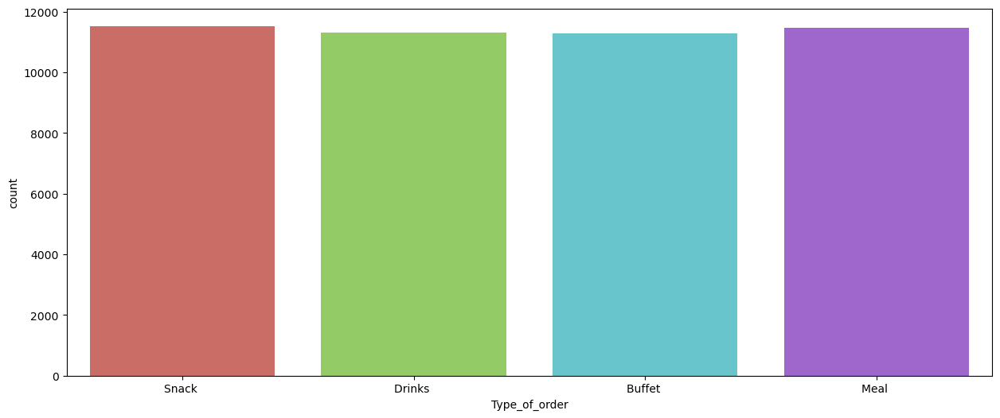

In [50]:
plt.figure(figsize=(15, 6))
sns.countplot(x='Type_of_order', data=df, palette='hls')
plt.xticks(rotation=0)
plt.show()



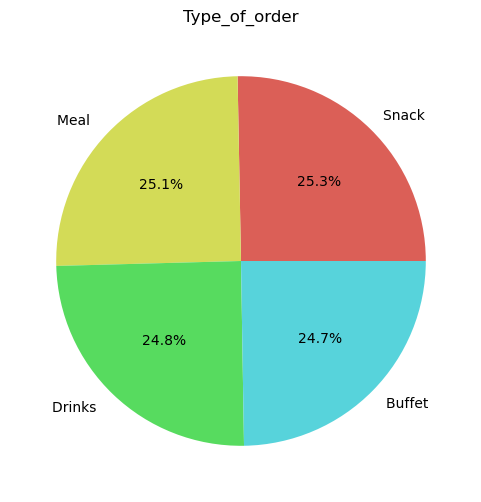

In [51]:
plt.figure(figsize=(15, 6))
counts = df['Type_of_order'].value_counts()
plt.pie(counts, labels=counts.index, autopct='%1.1f%%', colors=sns.color_palette('hls'))
plt.title('Type_of_order')
plt.show()

In [52]:
df['Type_of_vehicle'].unique()

array(['motorcycle ', 'scooter ', 'electric_scooter ', 'bicycle '],
      dtype=object)

In [53]:
df['Type_of_vehicle'].value_counts()

motorcycle           26435
scooter              15276
electric_scooter      3814
bicycle                 68
Name: Type_of_vehicle, dtype: int64

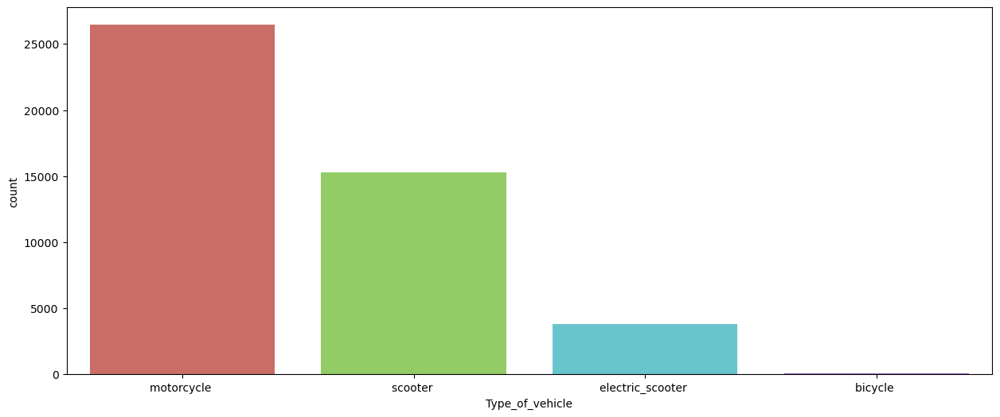

In [54]:
plt.figure(figsize=(15,6))
sns.countplot(x='Type_of_vehicle', data = df, palette = 'hls')
plt.xticks(rotation = 0)
plt.show()

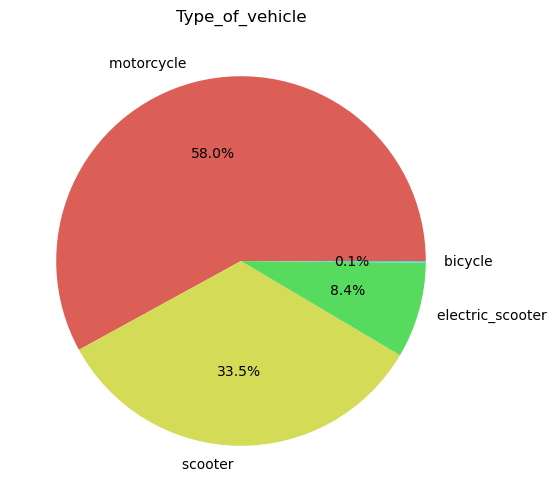

In [55]:
plt.figure(figsize=(15, 6))
counts = df['Type_of_vehicle'].value_counts()
plt.pie(counts, labels=counts.index, autopct='%1.1f%%', colors=sns.color_palette('hls'))
plt.title('Type_of_vehicle')
plt.show()

In [56]:


for column in numerical_columns:
    fig = px.histogram(df, x=column, nbins=20, histnorm='probability density')
    fig.update_layout(title=f"Histogram of {column}", xaxis_title=column, yaxis_title="Probability Density")
    fig.show()

In [57]:
for column in numerical_columns:
    fig = px.violin(df, y=column)
    fig.update_layout(title=f"Violin Plot of {column}", yaxis_title=column)
    fig.show()

In [58]:
df_corr = df.corr()
df_corr

,Delivery_person_Age,Delivery_person_Ratings,Restaurant_latitude,Restaurant_longitude,Delivery_location_latitude,Delivery_location_longitude,Time_taken(min)
Delivery_person_Age,1.000000,-0.067449,-0.001955,-0.006796,0.002359,-0.000593,0.292708
Delivery_person_Ratings,-0.067449,1.000000,-0.004846,-0.011147,-0.010198,-0.013350,-0.331103
Restaurant_latitude,-0.001955,-0.004846,1.000000,0.661784,0.866378,0.602713,0.013981
Restaurant_longitude,-0.006796,-0.011147,0.661784,1.000000,0.632293,0.915026,0.007821
Delivery_location_latitude,0.002359,-0.010198,0.866378,0.632293,1.000000,0.690515,0.014243
Delivery_location_longitude,-0.000593,-0.013350,0.602713,0.915026,0.690515,1.000000,0.007625
Time_taken(min),0.292708,-0.331103,0.013981,0.007821,0.014243,0.007625,1.000000


In [59]:
import plotly.graph_objects as go
fig = go.Figure(data=go.Heatmap(
    z=df_corr.values,
    x=df_corr.columns,
    y=df_corr.index,
    colorscale='Viridis',  # Use a valid colorscale name
    colorbar=dict(title='Correlation')
))

fig.update_layout(
    title='Correlation Heatmap',
    xaxis=dict(title='X-axis labels'),
    yaxis=dict(title='Y-axis labels'),
    width=800,
    height=400,
    plot_bgcolor='white'
)

fig.show()

EXTRACTING TIME COMPONENTS

In [70]:
df['hour_of_day'] = pd.to_datetime(df['Time_taken(min)'], unit='m').dt.hour
df['day_of_week'] = pd.to_datetime(df['Time_taken(min)'], unit='m').dt.dayofweek
df['month_of_year'] = pd.to_datetime(df['Time_taken(min)'], unit='m').dt.month

In [71]:
#FUNCTION FOR TIME CALCULATION THROUGH LATITUDES AND LONGITUDES
def calculate_distance(lat1, lon1, lat2, lon2):
    R = 6371  # Earth's radius in kilometers

    # Convert latitude and longitude from degrees to radians
    lat1_rad = math.radians(lat1)
    lon1_rad = math.radians(lon1)
    lat2_rad = math.radians(lat2)
    lon2_rad = math.radians(lon2)

    # Haversine formula to calculate distance
    dlat = lat2_rad - lat1_rad
    dlon = lon2_rad - lon1_rad
    a = math.sin(dlat/2) ** 2 + math.cos(lat1_rad) * math.cos(lat2_rad) * math.sin(dlon/2) ** 2
    c = 2 * math.atan2(math.sqrt(a), math.sqrt(1-a))
    distance = R * c

    return distance

# Calculate distance and create the distance feature
df['distance'] = df.apply(lambda row: calculate_distance(row['Restaurant_latitude'], row['Restaurant_longitude'],
                                                        row['Delivery_location_latitude'], row['Delivery_location_longitude']), axis=1)

In [72]:
#CATEGORIZE AGE TO 3 Types: YOUNG<MIDDLE AGED< OLD 
age_bins = [0, 30, 50, float('inf')]
age_labels = ['young', 'middle-aged', 'old']
df['age_category'] = pd.cut(df['Delivery_person_Age'], bins=age_bins, labels=age_labels)

In [73]:
df['avg_ratings'] = df.groupby('Delivery_person_ID')['Delivery_person_Ratings'].transform('mean')

In [74]:
#BINARY ENCODING 
df = pd.get_dummies(df, columns=['Type_of_order', 'Type_of_vehicle'])

KeyError: "None of [Index(['Type_of_order', 'Type_of_vehicle'], dtype='object')] are in the [columns]"

In [75]:
df['time_ratings_interaction'] = df['Time_taken(min)'] * df['Delivery_person_Ratings']

In [65]:
df.head(5)

,ID,Delivery_person_ID,Delivery_person_Age,Delivery_person_Ratings,Restaurant_latitude,Restaurant_longitude,Delivery_location_latitude,Delivery_location_longitude,Time_taken(min),distance,...,avg_ratings,Type_of_order_Buffet,Type_of_order_Drinks,Type_of_order_Meal,Type_of_order_Snack,Type_of_vehicle_bicycle,Type_of_vehicle_electric_scooter,Type_of_vehicle_motorcycle,Type_of_vehicle_scooter,time_ratings_interaction
0,4607,INDORES13DEL02,37,4.9,22.745049,75.892471,22.765049,75.912471,24,3.025149,...,4.604839,0,0,0,1,0,0,1,0,117.6
1,B379,BANGRES18DEL02,34,4.5,12.913041,77.683237,13.043041,77.813237,33,20.183530,...,4.653571,0,0,0,1,0,0,0,1,148.5
2,5D6D,BANGRES19DEL01,23,4.4,12.914264,77.678400,12.924264,77.688400,26,1.552758,...,4.698182,0,1,0,0,0,0,1,0,114.4
3,7A6A,COIMBRES13DEL02,38,4.7,11.003669,76.976494,11.053669,77.026494,21,7.790401,...,4.593443,1,0,0,0,0,0,1,0,98.7
4,70A2,CHENRES12DEL01,32,4.6,12.972793,80.249982,13.012793,80.289982,30,6.210138,...,4.675439,0,0,0,1,0,0,0,1,138.0


In [76]:
#DROP FEW COLUMNS 
drop_columns = ['ID', 'Delivery_person_ID', 'Restaurant_latitude', 'Restaurant_longitude', 
                   'Delivery_location_latitude', 'Delivery_location_longitude']
df.drop(columns=drop_columns)

,Delivery_person_Age,Delivery_person_Ratings,Time_taken(min),distance,age_category,avg_ratings,Type_of_order_Buffet,Type_of_order_Drinks,Type_of_order_Meal,Type_of_order_Snack,Type_of_vehicle_bicycle,Type_of_vehicle_electric_scooter,Type_of_vehicle_motorcycle,Type_of_vehicle_scooter,time_ratings_interaction,hour_of_day,day_of_week,month_of_year
0,37,4.9,24,3.025149,middle-aged,4.604839,0,0,0,1,0,0,1,0,117.6,0,3,1
1,34,4.5,33,20.183530,middle-aged,4.653571,0,0,0,1,0,0,0,1,148.5,0,3,1
2,23,4.4,26,1.552758,young,4.698182,0,1,0,0,0,0,1,0,114.4,0,3,1
3,38,4.7,21,7.790401,middle-aged,4.593443,1,0,0,0,0,0,1,0,98.7,0,3,1
4,32,4.6,30,6.210138,middle-aged,4.675439,0,0,0,1,0,0,0,1,138.0,0,3,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
45588,30,4.8,32,1.489846,young,4.668333,0,0,1,0,0,0,1,0,153.6,0,3,1
45589,21,4.6,36,11.007735,young,4.592308,1,0,0,0,0,0,1,0,165.6,0,3,1
45590,30,4.9,16,4.657195,young,4.670455,0,1,0,0,0,0,0,1,78.4,0,3,1
45591,20,4.7,26,6.232393,young,4.612903,0,0,0,1,0,0,1,0,122.2,0,3,1


In [77]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OneHotEncoder

In [78]:
fscale= ['Delivery_person_Age', 'Delivery_person_Ratings', 'time_ratings_interaction']
nscale = ['Time_taken(min)', 'hour_of_day', 'day_of_week', 'month_of_year', 'distance',
                         'age_category', 'avg_ratings', 'Type_of_order_Buffet ', 'Type_of_order_Drinks ',
                         'Type_of_order_Meal ', 'Type_of_order_Snack ', 'Type_of_vehicle_bicycle ',
                         'Type_of_vehicle_electric_scooter ', 'Type_of_vehicle_motorcycle ',
                         'Type_of_vehicle_scooter ']
target = 'Time_taken(min)'

In [79]:
X_train, X_test, y_train, y_test = train_test_split(df[fscale + nscale], df[target], test_size=0.25, random_state=42)

In [80]:
sc = StandardScaler()
X_train_scaled = X_train.copy()
X_test_scaled = X_test.copy()
X_train_scaled[fscale] = sc.fit_transform(X_train_scaled[fscale])
X_test_scaled[fscale] = sc.transform(X_test_scaled[fscale])

In [81]:
# Perform one-hot encoding for the 'age_category' feature
ct = ColumnTransformer(
    [('one_hot_encoder', OneHotEncoder(), ['age_category'])],
    remainder='passthrough'
)
X_train_scaled = ct.fit_transform(X_train_scaled)
X_test_scaled = ct.transform(X_test_scaled)

In [83]:
model_lr = LinearRegression()
model_lr.fit(X_train_scaled, y_train)

LinearRegression()

In [84]:
y_pred = model_lr.predict(X_test_scaled)

In [85]:
rmse = mean_squared_error(y_test, y_pred, squared=False)
print('Root Mean Squared Error:', rmse)

Root Mean Squared Error: 6.491518560454943e-14


In [86]:
from sklearn.metrics import r2_score
r2_lr = r2_score(y_test, y_pred)
print('R-squared Score:', r2_lr)

# Calculate Mean Squared Error (MSE)
mse = mean_squared_error(y_test, y_pred)
print('Mean Squared Error:', mse)

R-squared Score: 1.0
Mean Squared Error: 4.213981322073102e-27


In [90]:

from sklearn.tree import DecisionTreeRegressor
from xgboost import XGBRegressor
dt_regressor = DecisionTreeRegressor(random_state=42)
dt_regressor.fit(X_train_scaled, y_train)

DecisionTreeRegressor(random_state=42)

In [92]:
y_pred_dt = dt_regressor.predict(X_test_scaled)
r2_dt = r2_score(y_test, y_pred_dt)
print('Decision Tree Regressor - R-squared Score:', r2_dt)
mse_dt = mean_squared_error(y_test, y_pred_dt)
print('Decision Tree Regressor - Mean Squared Error:', mse_dt)

Decision Tree Regressor - R-squared Score: 1.0
Decision Tree Regressor - Mean Squared Error: 0.0


#SAMPLE TEST FOR PREDICTION OF TIME ##

In [97]:
df.head(4)

,ID,Delivery_person_ID,Delivery_person_Age,Delivery_person_Ratings,Restaurant_latitude,Restaurant_longitude,Delivery_location_latitude,Delivery_location_longitude,Time_taken(min),distance,...,Type_of_order_Meal,Type_of_order_Snack,Type_of_vehicle_bicycle,Type_of_vehicle_electric_scooter,Type_of_vehicle_motorcycle,Type_of_vehicle_scooter,time_ratings_interaction,hour_of_day,day_of_week,month_of_year
0,4607,INDORES13DEL02,37,4.9,22.745049,75.892471,22.765049,75.912471,24,3.025149,...,0,1,0,0,1,0,117.6,0,3,1
1,B379,BANGRES18DEL02,34,4.5,12.913041,77.683237,13.043041,77.813237,33,20.183530,...,0,1,0,0,0,1,148.5,0,3,1
2,5D6D,BANGRES19DEL01,23,4.4,12.914264,77.678400,12.924264,77.688400,26,1.552758,...,0,0,0,0,1,0,114.4,0,3,1
3,7A6A,COIMBRES13DEL02,38,4.7,11.003669,76.976494,11.053669,77.026494,21,7.790401,...,0,0,0,0,1,0,98.7,0,3,1


In [98]:
sample_data = pd.DataFrame({
    'Delivery_person_ID':[1],
    'Delivery_person_Age': [30],
    'Delivery_person_Ratings': [4.5],
    'Restaurant_latitude': [40.1234],
    'Restaurant_longitude': [-73.5678],
    'Delivery_location_latitude': [40.4321],
    'Delivery_location_longitude': [-73.8765],
    'distance': [5.6],
    'Type_of_order_Buffet': [0],
    'Type_of_order_Drinks': [1],
    'Type_of_order_Meal': [0],
    'Type_of_order_Snack': [0],
    'Type_of_vehicle_bicycle': [0],
    'Type_of_vehicle_electric_scooter': [1],
    'Type_of_vehicle_motorcycle': [0],
    'Type_of_vehicle_scooter': [0],
    'hour_of_day': [12],
    'day_of_week': [2],
    'month_of_year': [7]
})


predictions = dt_regressor.predict(sample_data)

# Print the predicted time
print('Predicted Time (minutes):', predictions[0])

Predicted Time (minutes): 40.0


C:\Users\TARUN\anaconda3\lib\site-packages\sklearn\base.py:443: UserWarning:

X has feature names, but DecisionTreeRegressor was fitted without feature names

